This notebook is created to practice Attention based NLP models.

Most of the code is taken from LinkedIn course:

https://www.linkedin.com/learning/introduction-to-attention-based-neural-networks/implementing-bahdanau-attention

I  put all the blocks of code together in one notebook and made the detailed comments.
This will help to understand the concept of Transformers and learn the Attention based models architecture easier.

Your comments and elaboration ideas on that project are highly appreciated!



<h2>Exploring the dataset</h2>
<p>Reading the image data and their corresponding captions from the flick dataset folder. Showing the image and captions to get the insighs of the data. Dowload link for the dataset used <a href="https://www.kaggle.com/adityajn105/flickr8k">here</a></p>

In [1]:
!pip install opendatasets
!pip install pandas

In [2]:
import opendatasets as od
import pandas

od.download("https://www.kaggle.com/datasets/adityajn105/flickr8k")

100%|██████████| 1.04G/1.04G [00:12<00:00, 92.4MB/s]


In [3]:
#location of the data
data_location =  "/content/flickr8k"
!ls $data_location

captions.txt  Images


In [4]:
#reading the text data
import pandas as pd
caption_file = data_location + '/captions.txt'
df = pd.read_csv(caption_file)
print("There are {} image to captions".format(len(df)))
df.head(7)

There are 40455 image to captions


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
5,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
6,1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with...


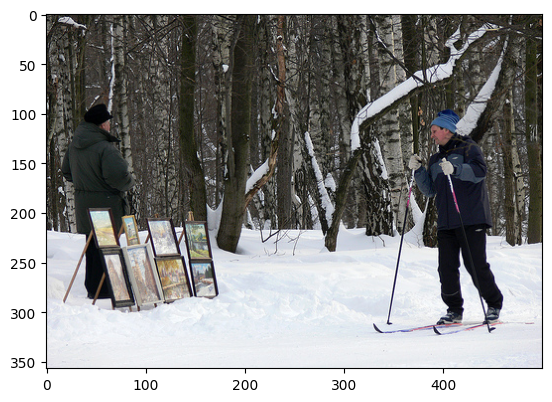

Caption: A man skis past another man displaying paintings in the snow .
Caption: A person wearing skis looking at framed pictures set up in the snow .
Caption: A skier looks at framed pictures in the snow next to trees .
Caption: Man on skis looking at artwork for sale in the snow
Caption: A collage of one person climbing a cliff .


In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

#select any index from the whole dataset
#single image has 5 captions
#so, select indx as: 1,6,11,16...
data_idx = 56

#eg path to be plot: ../input/flickr8k/Images/1000268201_693b08cb0e.jpg
image_path = data_location+"/Images/"+df.iloc[data_idx,0]
img=mpimg.imread(image_path)
plt.imshow(img)
plt.show()

#image consits of 5 captions,
#showing all 5 captions of the image of the given idx
for i in range(data_idx,data_idx+5):
    print("Caption:",df.iloc[i,1])


# Custom dataset with Vocabulary

<p>Writing the custom torch dataset class so, that we can abastract out the dataloading steps during the training and validation process</p>
<p>Here, dataloader is created which gives the batch of image and its captions with following processing done:</p>

<li>caption word tokenized to unique numbers</li>
<li>vocab instance created to store all the relivent words in the datasets</li>
<li>each batch, caption padded to have same sequence length</li>
<li>image resized to the desired size and converted into captions</li>

<br><p>In this way the dataprocessing is done, and the dataloader is ready to be used with <b>Pytorch</b></p>

In [6]:
#imports
import os
from collections import Counter
import spacy
import torch
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T

from PIL import Image

In [15]:
 !python -m spacy download en_core_web_sm

2023-11-16 14:25:41.747853: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-11-16 14:25:41.747913: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-11-16 14:25:41.747952: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-11-16 14:25:43.254573: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 42.9 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [17]:
#using spacy for the better text tokenization
spacy_eng = spacy.load("en_core_web_sm")

#example
text = "This is a good place to find a city"
[token.text.lower() for token in spacy_eng.tokenizer(text)]

['this', 'is', 'a', 'good', 'place', 'to', 'find', 'a', 'city']

In [18]:
class Vocabulary:
    def __init__(self,freq_threshold):
        #setting the pre-reserved tokens int to string tokens
        self.itos = {0:"<PAD>",1:"<SOS>",2:"<EOS>",3:"<UNK>"}

        #string to int tokens
        #its reverse dict self.itos
        self.stoi = {v:k for k,v in self.itos.items()}

        self.freq_threshold = freq_threshold

    def __len__(self): return len(self.itos)

    @staticmethod
    def tokenize(text):
        return [token.text.lower() for token in spacy_eng.tokenizer(text)]

    def build_vocab(self, sentence_list):
        frequencies = Counter()
        idx = 4

        for sentence in sentence_list:
            for word in self.tokenize(sentence):
                frequencies[word] += 1

                #add the word to the vocab if it reaches minum frequecy threshold
                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1

    def numericalize(self,text):
        """ For each word in the text corresponding index token for that word form the vocab built as list """
        tokenized_text = self.tokenize(text)
        return [ self.stoi[token] if token in self.stoi else self.stoi["<UNK>"] for token in tokenized_text ]

In [19]:
#testing the vicab class
v = Vocabulary(freq_threshold=1)

v.build_vocab(["This is a good place to find a city"])
print(v.stoi)
print(v.numericalize("This is a good place to find a city here!!"))

{'<PAD>': 0, '<SOS>': 1, '<EOS>': 2, '<UNK>': 3, 'this': 4, 'is': 5, 'a': 6, 'good': 7, 'place': 8, 'to': 9, 'find': 10, 'city': 11}
[4, 5, 6, 7, 8, 9, 10, 6, 11, 3, 3, 3]


In [20]:
class FlickrDataset(Dataset):
    """
    FlickrDataset
    """
    def __init__(self,root_dir,captions_file,transform=None,freq_threshold=5):
        self.root_dir = root_dir
        self.df = pd.read_csv(caption_file)
        self.transform = transform

        #Get image and caption colum from the dataframe
        self.imgs = self.df["image"]
        self.captions = self.df["caption"]

        #Initialize vocabulary and build vocab
        self.vocab = Vocabulary(freq_threshold)
        self.vocab.build_vocab(self.captions.tolist())


    def __len__(self):
        return len(self.df)

    def __getitem__(self,idx):
        caption = self.captions[idx]
        img_name = self.imgs[idx]
        img_location = os.path.join(self.root_dir,img_name)
        img = Image.open(img_location).convert("RGB")

        #apply the transfromation to the image
        if self.transform is not None:
            img = self.transform(img)

        #numericalize the caption text
        caption_vec = []
        caption_vec += [self.vocab.stoi["<SOS>"]]
        caption_vec += self.vocab.numericalize(caption)
        caption_vec += [self.vocab.stoi["<EOS>"]]

        return img, torch.tensor(caption_vec)

In [21]:
#show the tensor image
import matplotlib.pyplot as plt
def show_image(img, title=None):
    """Imshow for Tensor."""

    #unnormalize
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224
    img[2] = img[2] * 0.225
    img[0] += 0.485
    img[1] += 0.456
    img[2] += 0.406

    img = img.numpy().transpose((1, 2, 0))


    plt.imshow(img)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

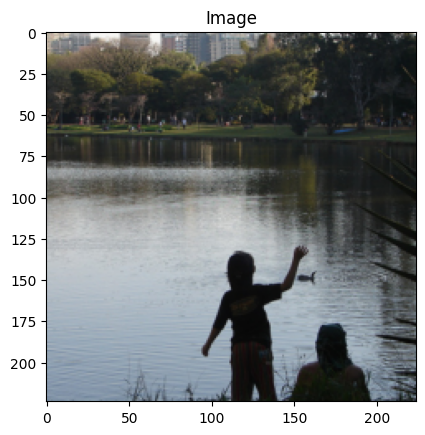

Token: tensor([  1,   4,  28,  16,   4,  80,  34,  19, 766, 163,   8,   4, 250, 215,
          5,   2])
Sentence:
['<SOS>', 'a', 'child', 'and', 'a', 'woman', 'are', 'at', 'waters', 'edge', 'in', 'a', 'big', 'city', '.', '<EOS>']


In [22]:
#defining the transform to be applied
transforms = T.Compose([
    T.Resize(226),
    T.RandomCrop(224),
    T.ToTensor(),
    T.Normalize((0.485, 0.456, 0.406),(0.229, 0.224, 0.225))
])

#testing the dataset class
dataset =  FlickrDataset(
    root_dir = data_location+"/Images",
    captions_file = data_location+"/captions.txt",
    transform=transforms
)



img, caps = dataset[80]
show_image(img,"Image")
print("Token:",caps)
print("Sentence:")
print([dataset.vocab.itos[token] for token in caps.tolist()])

In [23]:
class CapsCollate:
    """
    Collate to apply the padding to the captions with dataloader
    """
    def __init__(self,pad_idx,batch_first=False):
        self.pad_idx = pad_idx
        self.batch_first = batch_first

    def __call__(self,batch):
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs,dim=0)

        targets = [item[1] for item in batch]
        targets = pad_sequence(targets, batch_first=self.batch_first, padding_value=self.pad_idx)
        return imgs,targets

In [24]:
#writing the dataloader
#setting the constants
BATCH_SIZE = 4
NUM_WORKER = 1

#token to represent the padding
pad_idx = dataset.vocab.stoi["<PAD>"]

data_loader = DataLoader(
    dataset=dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
)

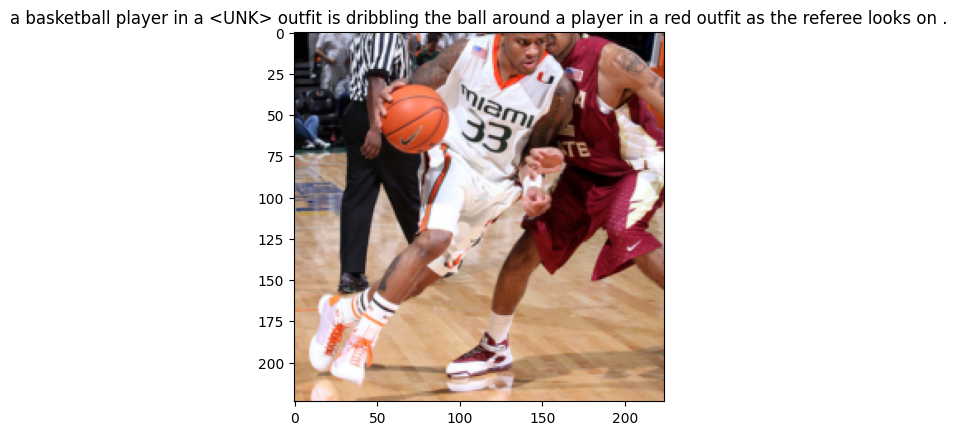

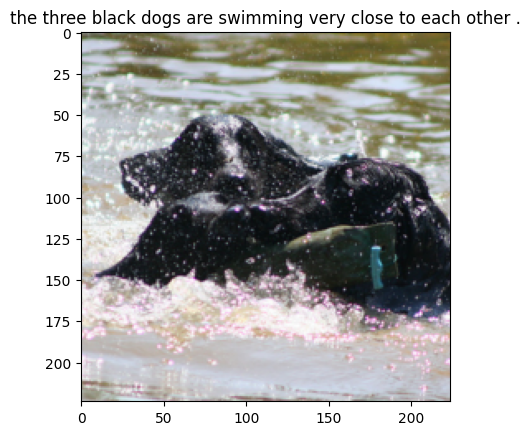

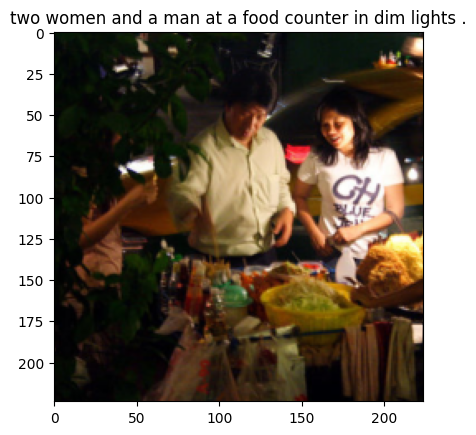

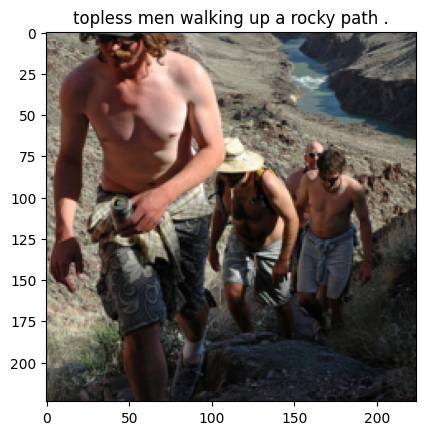

In [25]:
#generating the iterator from the dataloader
dataiter = iter(data_loader)

#getting the next batch
batch = next(dataiter)

#unpacking the batch
images, captions = batch

#showing info of image in single batch
for i in range(BATCH_SIZE):
    img,cap = images[i],captions[i]
    caption_label = [dataset.vocab.itos[token] for token in cap.tolist()]
    eos_index = caption_label.index('<EOS>')
    caption_label = caption_label[1:eos_index]
    caption_label = ' '.join(caption_label)
    show_image(img,caption_label)
    plt.show()

# Attention Model configuration

The model consists of three modules: EncoderCNN, Attention, and DecoderRNN.

* EncoderCNN is a pre-trained ResNet50 model that extracts feature maps from input images.
* Attention is a module that allows the DecoderRNN to pay attention to certain features in the input. It generates an alignment score between the feature map representation and the previous decoder hidden state, which is used to calculate the context vector.
* DecoderRNN generates captions given the feature map representation and the previous word prediction. It uses the attention module to generate the context vector and passes it through an LSTM cell to generate the next hidden state. The output of the LSTM cell is passed through a linear layer to generate a one-hot vector of the predicted word.

In [26]:
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision.models as models
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T

In [27]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [28]:
# feature map representation from ResNet model will be used as input to our Attention model
class EncoderCNN(nn.Module):
    def __init__(self):
        super(EncoderCNN, self).__init__()
        resnet = models.resnet50(pretrained=True)
        for param in resnet.parameters():
            param.requires_grad_(False)

        modules = list(resnet.children())[:-2] # everythin except last Conv block
        self.resnet = nn.Sequential(*modules)


    def forward(self, images):
        features = self.resnet(images)                                    #(batch_size,2048,7,7)
        features = features.permute(0, 2, 3, 1)                           #(batch_size,7,7,2048)
        features = features.view(features.size(0), -1, features.size(-1)) #(batch_size,49,2048)
        return features

In [29]:
#Bahdanau Attention - allows our Decoder to pay attention to certain features (important parts)
class Attention(nn.Module):
    def __init__(self, encoder_dim,decoder_dim,attention_dim):
        super(Attention, self).__init__()

        self.attention_dim = attention_dim

        # we pass encoder/decoder hidden states to weights layer
        self.W = nn.Linear(decoder_dim,attention_dim)
        self.U = nn.Linear(encoder_dim,attention_dim)

        # generate alignment scores
        self.A = nn.Linear(attention_dim,1)

    # as input we accept feature map representation  and prev decoder hidden state
    def forward(self, features, hidden_state):
        u_hs = self.U(features)     #(batch_size,num_layers,attention_dim)
        w_ah = self.W(hidden_state) #(batch_size,attention_dim)

        # adding one mode dimension for combined states
        combined_states = torch.tanh(u_hs + w_ah.unsqueeze(1)) #(batch_size,num_layers,attemtion_dim)

        attention_scores = self.A(combined_states)         #(batch_size,num_layers,1)
        attention_scores = attention_scores.squeeze(2)     #(batch_size,num_layers)

        # conversion to probabilities using softmax
        alpha = F.softmax(attention_scores,dim=1)          #(batch_size,num_layers)

        # generating the context vector
        attention_weights = features * alpha.unsqueeze(2)  #(batch_size,num_layers,features_dim)
        attention_weights = attention_weights.sum(dim=1)   #(batch_size,num_layers)

        return alpha,attention_weights



In [30]:
# Attention Decoder module to generate captions
class DecoderRNN(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()

        #save the model param
        self.vocab_size = vocab_size
        self.attention_dim = attention_dim
        self.decoder_dim = decoder_dim

        # generate embeddings for words
        self.embedding = nn.Embedding(vocab_size,embed_size)
        self.attention = Attention(encoder_dim,decoder_dim,attention_dim)

        # features representation
        self.init_h = nn.Linear(encoder_dim, decoder_dim)
        self.init_c = nn.Linear(encoder_dim, decoder_dim)
        self.lstm_cell = nn.LSTMCell(embed_size+encoder_dim,decoder_dim,bias=True)
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)

        # linear layer that outputs one-hot vector of predicted word
        self.fcn = nn.Linear(decoder_dim,vocab_size)
        self.drop = nn.Dropout(drop_prob)

    # inputs are feature representation and captions (vectors)
    def forward(self, features, captions):

        #vectorize the caption
        embeds = self.embedding(captions)

        # Initialize LSTM state
        h, c = self.init_hidden_state(features)  # (batch_size, decoder_dim)

        #get the seq length to iterate
        seq_length = len(captions[0])-1 #Exclude the last one
        batch_size = captions.size(0)
        num_features = features.size(1)

        # predicted captions in form of one-hot vectors
        preds = torch.zeros(batch_size, seq_length, self.vocab_size).to(device)
        alphas = torch.zeros(batch_size, seq_length,num_features).to(device)

        # feed in the input for each time instance along with context vectors
        for s in range(seq_length):
            # first, pass the features and decoder hidden state
            alpha,context = self.attention(features, h)

            # lstm input are embeddings repr words and context vectors
            lstm_input = torch.cat((embeds[:, s], context), dim=1)

            # hidden state for next time instance
            h, c = self.lstm_cell(lstm_input, (h, c))

            # pass through dropout layer
            output = self.fcn(self.drop(h))

            # get the prediction and weights
            preds[:,s] = output
            alphas[:,s] = alpha

        return preds, alphas

    def generate_caption(self,features,max_len=50,vocab=None):
        # Inference part
        # Given the image features generate the captions

        batch_size = features.size(0)
        h, c = self.init_hidden_state(features)  # (batch_size, decoder_dim)

        # store the weights
        alphas = []

        #starting input
        word = torch.tensor(vocab.stoi['<SOS>']).view(1,-1).to(device)
        embeds = self.embedding(word)

        # captions generated
        captions = []

        for i in range(max_len):
            # take encoder output and compute the current attention
            alpha,context = self.attention(features, h)

            #store the apla score
            alphas.append(alpha.cpu().detach().numpy())

            # conatenation of current state embeddings and context vectors
            lstm_input = torch.cat((embeds[:, 0], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))
            output = self.fcn(self.drop(h))
            output = output.view(batch_size,-1)

            #select the word with most val
            predicted_word_idx = output.argmax(dim=1)

            #save the generated word
            captions.append(predicted_word_idx.item())

            #end if <EOS detected>
            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break

            #send generated word as the next caption
            embeds = self.embedding(predicted_word_idx.unsqueeze(0))

        #covert the vocab idx to words and return sentence
        return [vocab.itos[idx] for idx in captions],alphas

    # features from encoder CNN
    def init_hidden_state(self, encoder_out):
        batch_size = encoder_out.size(0)
        h = torch.zeros(batch_size, self.decoder_dim).to(encoder_out.device)
        c = torch.zeros(batch_size, self.decoder_dim).to(encoder_out.device)
        return h, c

In [31]:
# Seq2Seq model to generate image captions

class EncoderDecoder(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()
        # encoder doesn't need any params to specify
        self.encoder = EncoderCNN()
        # decoder params need to be specified
        self.decoder = DecoderRNN(
            embed_size=embed_size,
            vocab_size = len(dataset.vocab),
            attention_dim=attention_dim,
            encoder_dim=encoder_dim,
            decoder_dim=decoder_dim
        )

    def forward(self, images, captions):
        # pass the images through encoder to ger feature representations
        features = self.encoder(images)
        # features and captions are passed to decoder
        outputs = self.decoder(features, captions)
        return outputs


# Setting Hypperparameter and model initialization

In [32]:
# Hyperparams to tweak

embed_size=500
vocab_size = len(dataset.vocab)
attention_dim=256
encoder_dim=2048
decoder_dim=512
learning_rate = 3e-4

In [33]:
# Seq2Seq model initialization

model = EncoderDecoder(
    embed_size=500,
    vocab_size = len(dataset.vocab),
    attention_dim=256,
    encoder_dim=2048,
    decoder_dim=512
).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 151MB/s]


In [34]:
# helper function to save the model
def save_model(model,num_epochs):
    model_state = {
        'num_epochs':num_epochs,
        'embed_size':embed_size,
        'vocab_size':len(dataset.vocab),
        'attention_dim':attention_dim,
        'encoder_dim':encoder_dim,
        'decoder_dim':decoder_dim,
        'state_dict':model.state_dict()
    }

    torch.save(model_state,'attention_model_state.pth')

# Training Job from above configs

**Watch as with every epoch the generated text becomes more and more meaningful !**

Epoch: 1 Batch: 1000 loss: 3.74438
Epoch: 1 Batch: 2000 loss: 3.49828
Epoch: 1 Batch: 3000 loss: 4.11028
Epoch: 1 Batch: 4000 loss: 2.40215
Epoch: 1 Batch: 5000 loss: 3.71723
Epoch: 1 Batch: 6000 loss: 2.27345
Epoch: 1 Batch: 7000 loss: 2.68358
Epoch: 1 Batch: 8000 loss: 3.40204
Epoch: 1 Batch: 9000 loss: 3.44400
Epoch: 1 Batch: 10000 loss: 3.48618


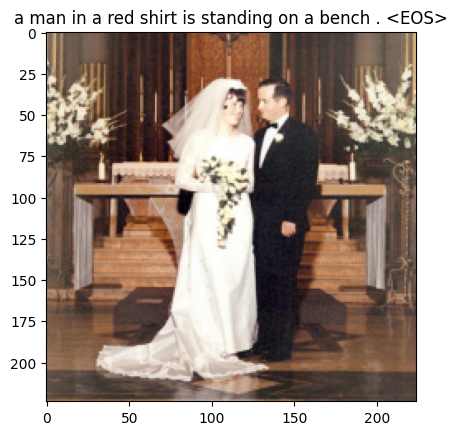

Epoch: 2 Batch: 1000 loss: 2.91473
Epoch: 2 Batch: 2000 loss: 2.76674
Epoch: 2 Batch: 3000 loss: 3.26705
Epoch: 2 Batch: 4000 loss: 2.22791
Epoch: 2 Batch: 5000 loss: 2.55575
Epoch: 2 Batch: 6000 loss: 3.13813
Epoch: 2 Batch: 7000 loss: 2.51929
Epoch: 2 Batch: 8000 loss: 2.90341
Epoch: 2 Batch: 9000 loss: 3.24546
Epoch: 2 Batch: 10000 loss: 2.37893


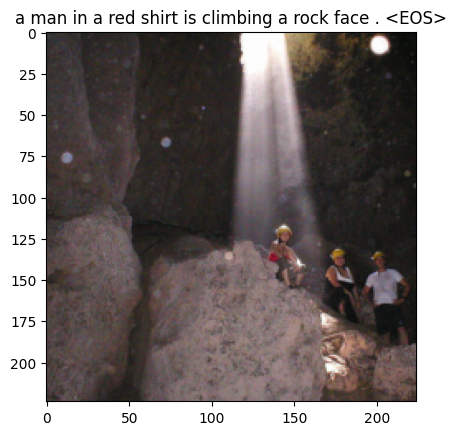

Epoch: 3 Batch: 1000 loss: 2.40495
Epoch: 3 Batch: 2000 loss: 2.49822
Epoch: 3 Batch: 3000 loss: 2.21995
Epoch: 3 Batch: 4000 loss: 3.08692
Epoch: 3 Batch: 5000 loss: 3.02213
Epoch: 3 Batch: 6000 loss: 2.40304
Epoch: 3 Batch: 7000 loss: 3.01187
Epoch: 3 Batch: 8000 loss: 2.82942
Epoch: 3 Batch: 9000 loss: 3.20371
Epoch: 3 Batch: 10000 loss: 2.29236


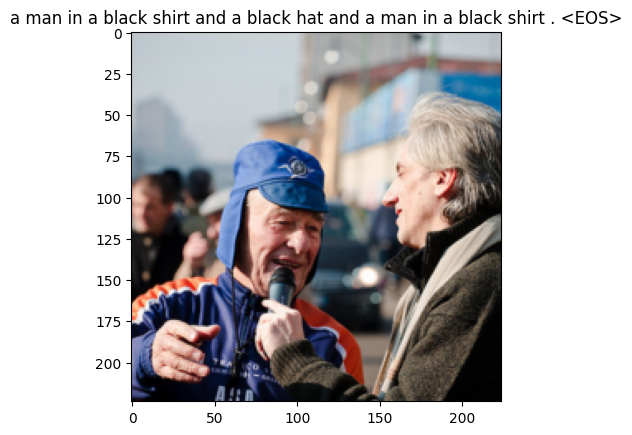

Epoch: 4 Batch: 1000 loss: 2.20016
Epoch: 4 Batch: 2000 loss: 2.95415
Epoch: 4 Batch: 3000 loss: 2.07170
Epoch: 4 Batch: 4000 loss: 2.37808
Epoch: 4 Batch: 5000 loss: 2.76912
Epoch: 4 Batch: 6000 loss: 2.12302
Epoch: 4 Batch: 7000 loss: 2.29620
Epoch: 4 Batch: 8000 loss: 2.39753
Epoch: 4 Batch: 9000 loss: 2.65308
Epoch: 4 Batch: 10000 loss: 3.11144


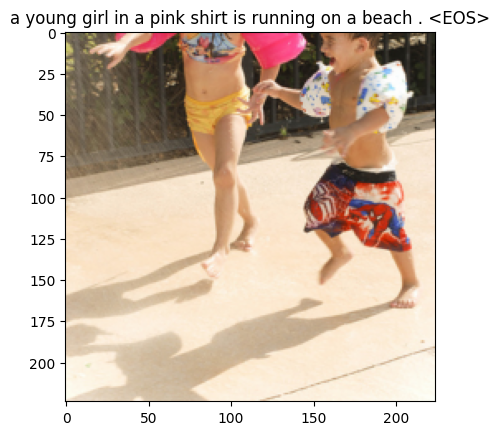

Epoch: 5 Batch: 1000 loss: 2.48623
Epoch: 5 Batch: 2000 loss: 2.76691
Epoch: 5 Batch: 3000 loss: 2.52947
Epoch: 5 Batch: 4000 loss: 2.67442
Epoch: 5 Batch: 5000 loss: 2.68864
Epoch: 5 Batch: 6000 loss: 2.82918
Epoch: 5 Batch: 7000 loss: 2.14169
Epoch: 5 Batch: 8000 loss: 2.87155
Epoch: 5 Batch: 9000 loss: 3.00258
Epoch: 5 Batch: 10000 loss: 2.14856


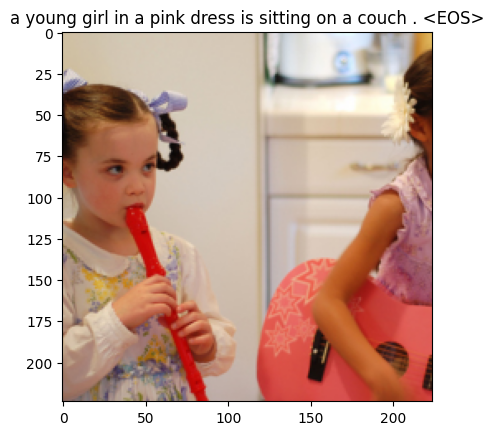

Epoch: 6 Batch: 1000 loss: 2.39432
Epoch: 6 Batch: 2000 loss: 2.01729
Epoch: 6 Batch: 3000 loss: 2.74345
Epoch: 6 Batch: 4000 loss: 2.70774
Epoch: 6 Batch: 5000 loss: 2.48721
Epoch: 6 Batch: 6000 loss: 2.41071
Epoch: 6 Batch: 7000 loss: 2.18371
Epoch: 6 Batch: 8000 loss: 2.42279
Epoch: 6 Batch: 9000 loss: 2.46177
Epoch: 6 Batch: 10000 loss: 2.59801


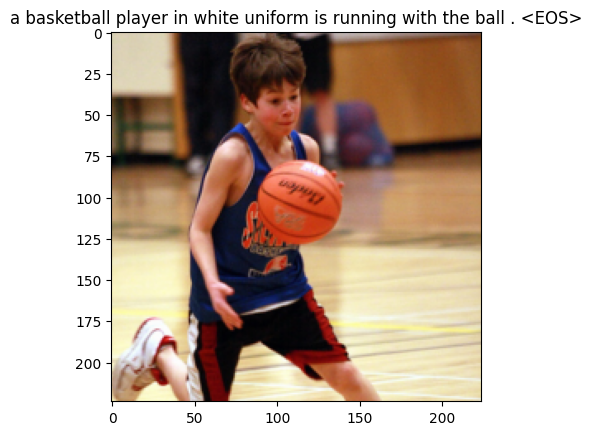

Epoch: 7 Batch: 1000 loss: 2.02494
Epoch: 7 Batch: 2000 loss: 3.22636
Epoch: 7 Batch: 3000 loss: 2.01598
Epoch: 7 Batch: 4000 loss: 2.25217
Epoch: 7 Batch: 5000 loss: 2.56878
Epoch: 7 Batch: 6000 loss: 2.12706
Epoch: 7 Batch: 7000 loss: 2.88881
Epoch: 7 Batch: 8000 loss: 3.19291
Epoch: 7 Batch: 9000 loss: 2.76454
Epoch: 7 Batch: 10000 loss: 2.17672


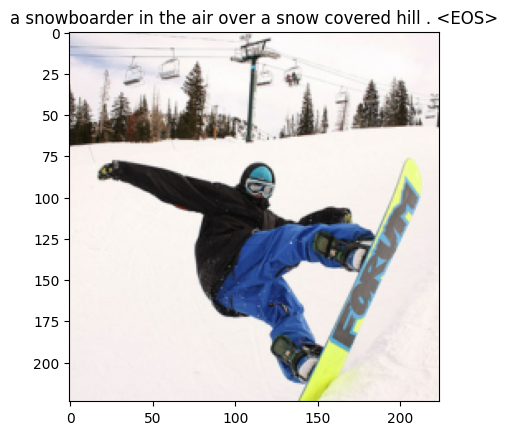

Epoch: 8 Batch: 1000 loss: 2.59298
Epoch: 8 Batch: 2000 loss: 1.75947
Epoch: 8 Batch: 3000 loss: 2.33657
Epoch: 8 Batch: 4000 loss: 3.09423
Epoch: 8 Batch: 5000 loss: 2.17139
Epoch: 8 Batch: 6000 loss: 2.69523
Epoch: 8 Batch: 7000 loss: 2.34191
Epoch: 8 Batch: 8000 loss: 2.46650
Epoch: 8 Batch: 9000 loss: 3.02418
Epoch: 8 Batch: 10000 loss: 2.67728


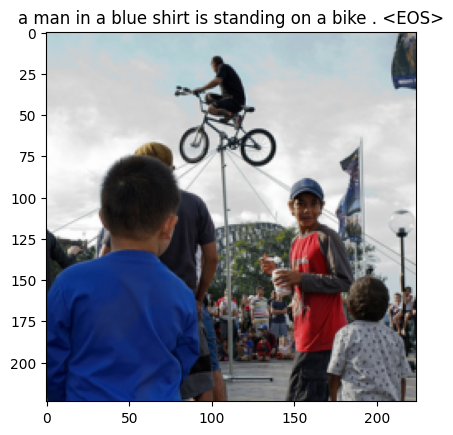

Epoch: 9 Batch: 1000 loss: 2.14618
Epoch: 9 Batch: 2000 loss: 2.78552
Epoch: 9 Batch: 3000 loss: 1.88745
Epoch: 9 Batch: 4000 loss: 2.08040
Epoch: 9 Batch: 5000 loss: 2.09257
Epoch: 9 Batch: 6000 loss: 2.04255
Epoch: 9 Batch: 7000 loss: 2.07434
Epoch: 9 Batch: 8000 loss: 2.95708
Epoch: 9 Batch: 9000 loss: 2.17978
Epoch: 9 Batch: 10000 loss: 1.95435


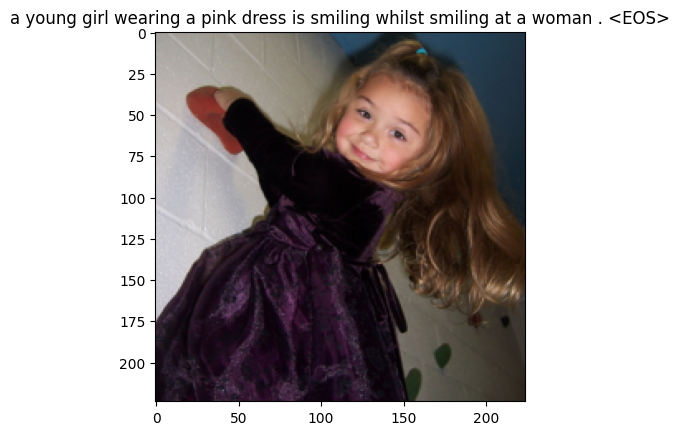

Epoch: 10 Batch: 1000 loss: 2.03424
Epoch: 10 Batch: 2000 loss: 2.18620
Epoch: 10 Batch: 3000 loss: 2.28138
Epoch: 10 Batch: 4000 loss: 3.08570
Epoch: 10 Batch: 5000 loss: 2.31840
Epoch: 10 Batch: 6000 loss: 2.18631
Epoch: 10 Batch: 7000 loss: 2.58556
Epoch: 10 Batch: 8000 loss: 2.40775
Epoch: 10 Batch: 9000 loss: 2.06903
Epoch: 10 Batch: 10000 loss: 2.75624


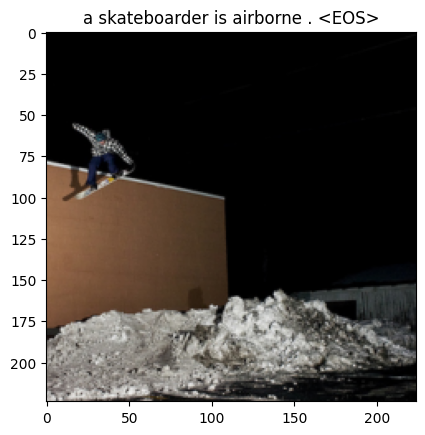

Epoch: 11 Batch: 1000 loss: 2.56213
Epoch: 11 Batch: 2000 loss: 1.93870
Epoch: 11 Batch: 3000 loss: 2.68194
Epoch: 11 Batch: 4000 loss: 2.01167
Epoch: 11 Batch: 5000 loss: 2.25669


KeyboardInterrupt: ignored

In [35]:
num_epochs = 25
print_every = 1000

for epoch in range(1,num_epochs+1):
    for idx, (image, captions) in enumerate(iter(data_loader)):
        image,captions = image.to(device),captions.to(device)

        # Zero the gradients.
        optimizer.zero_grad()

        # Feed forward
        outputs,attentions = model(image, captions)

        # Calculate the batch loss.
        targets = captions[:,1:]
        loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))

        # Backward pass.
        loss.backward()

        # Update the parameters in the optimizer.
        optimizer.step()

        if (idx+1)%print_every == 0:
            print("Epoch: {} Batch: {} loss: {:.5f}".format(epoch, idx+1, loss.item()))

    #generate the caption and display it
    model.eval()
    with torch.no_grad():
        dataiter = iter(data_loader)
        img,_ = next(dataiter)
        features = model.encoder(img[0:1].to(device))
        caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
        caption = ' '.join(caps)
        show_image(img[0],title=caption)

    model.train()

    #save the latest model after every epoch
    save_model(model,epoch)

# Visualizing the model'a attention

In [ ]:
# For visualising attentions following helper functions are defined.
# generate_caps-Given the image generate captions and attention scores show_attention-Plot the attention scores in the image

In [36]:
# generate caption
def get_caps_from(features_tensors):
    #generate the caption
    model.eval()
    with torch.no_grad():
        features = model.encoder(features_tensors.to(device))
        caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
        caption = ' '.join(caps)
        show_image(features_tensors[0],title=caption)

    return caps,alphas

In [37]:
# Show attention
def plot_attention(img, result, attention_plot):
    #untransform
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224
    img[2] = img[2] * 0.225
    img[0] += 0.485
    img[1] += 0.456
    img[2] += 0.406

    img = img.numpy().transpose((1, 2, 0))
    temp_image = img

    fig = plt.figure(figsize=(15, 15))

    len_result = len(result)
    for l in range(len_result):
        temp_att = attention_plot[l].reshape(7,7)

        ax = fig.add_subplot(len_result//2,len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.7, extent=img.get_extent())


    plt.tight_layout()
    plt.show()

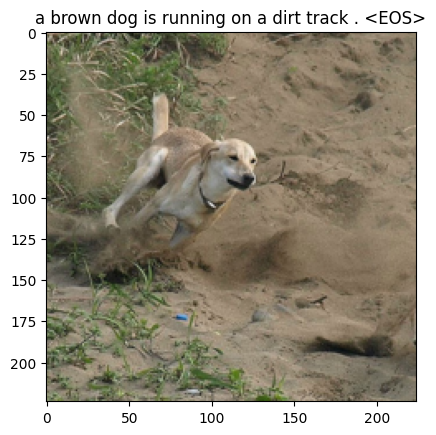

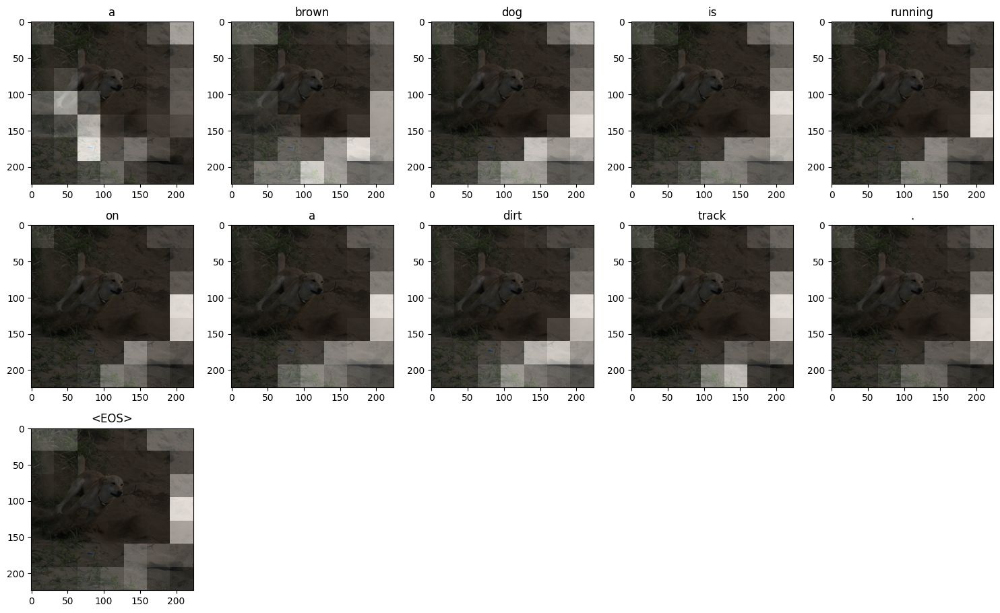

In [38]:
# show any 1
dataiter = iter(data_loader)
images,_ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps,alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)

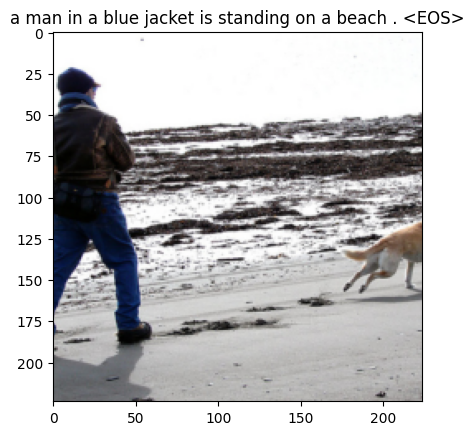

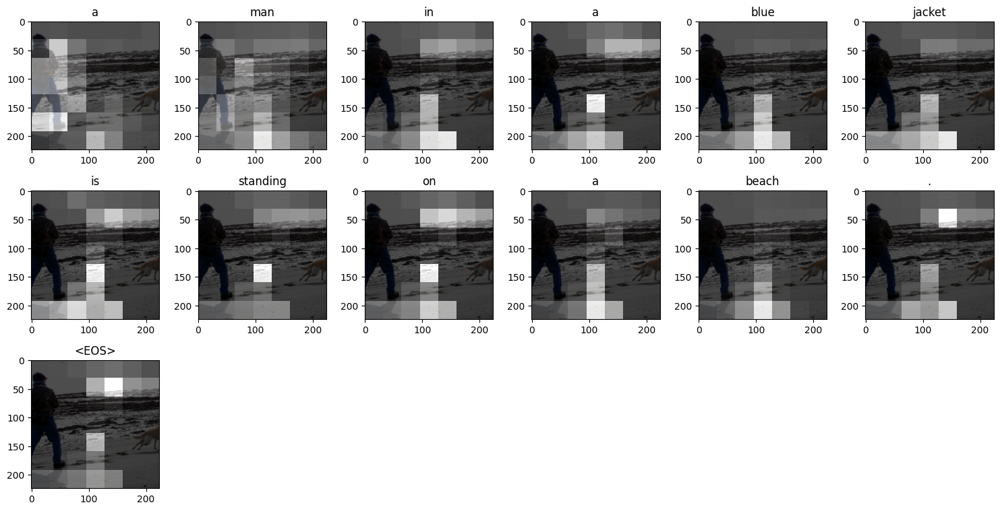

In [39]:
#show any 1
dataiter = iter(data_loader)
images,_ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps,alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)

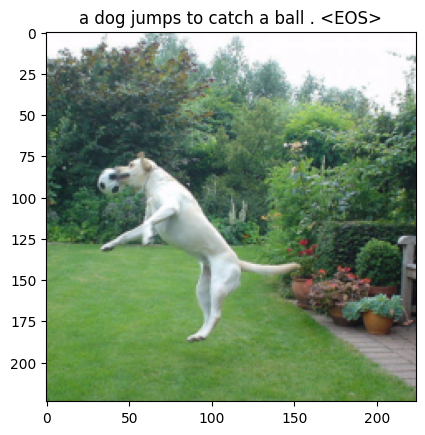

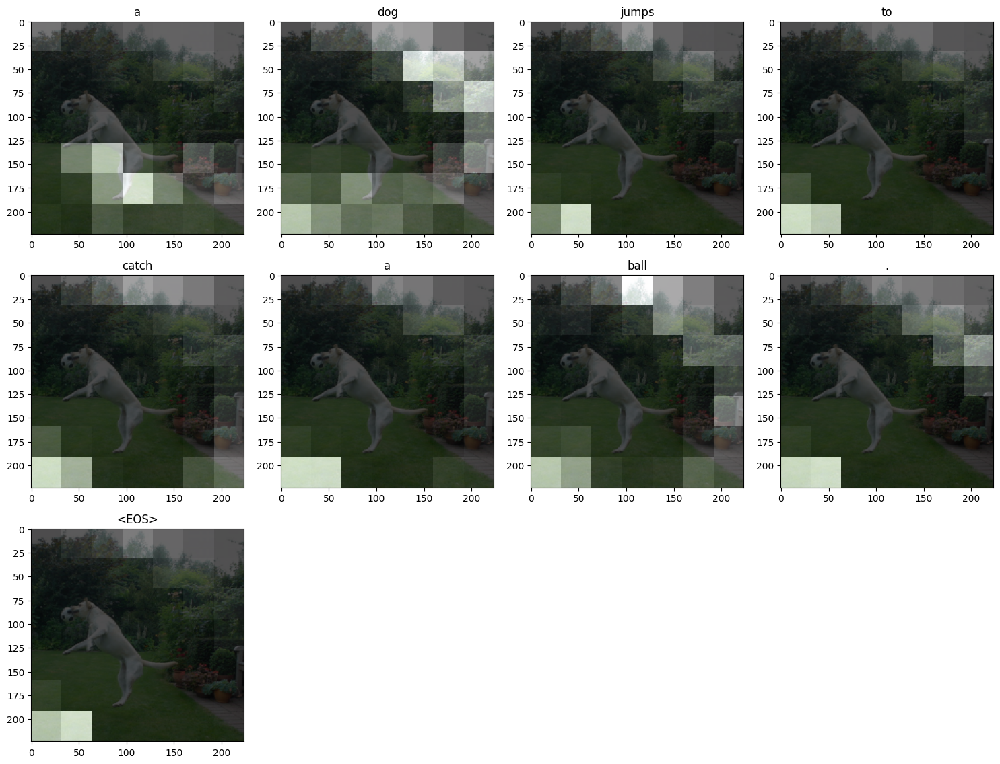

In [42]:
#show any 1
dataiter = iter(data_loader)
images,_ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps,alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)

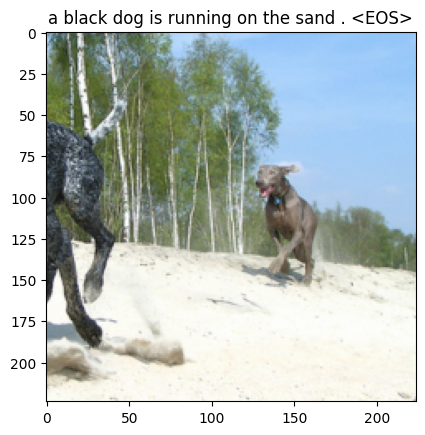

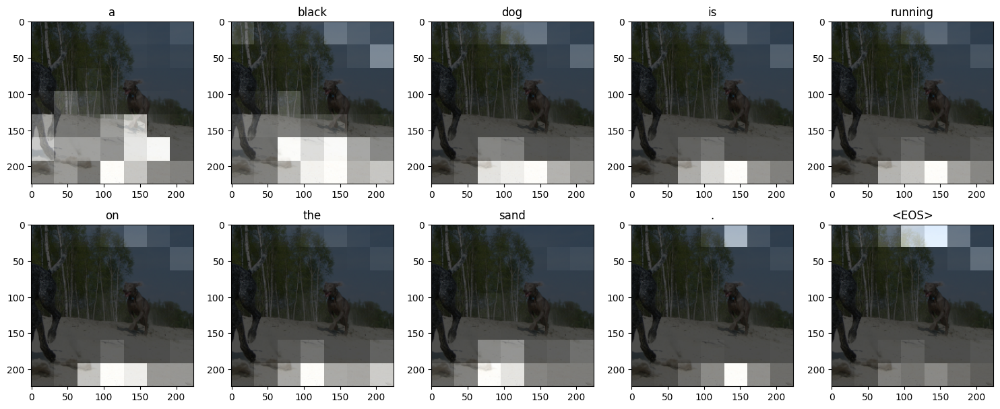

In [45]:
#show any 1
dataiter = iter(data_loader)
images,_ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps,alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)

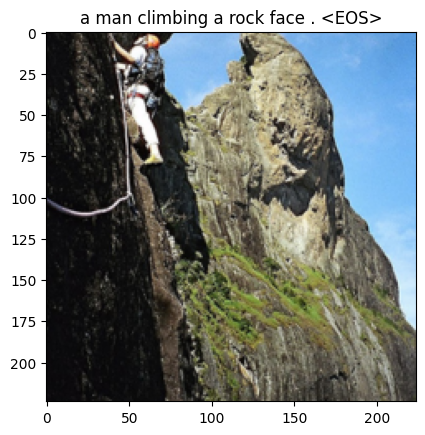

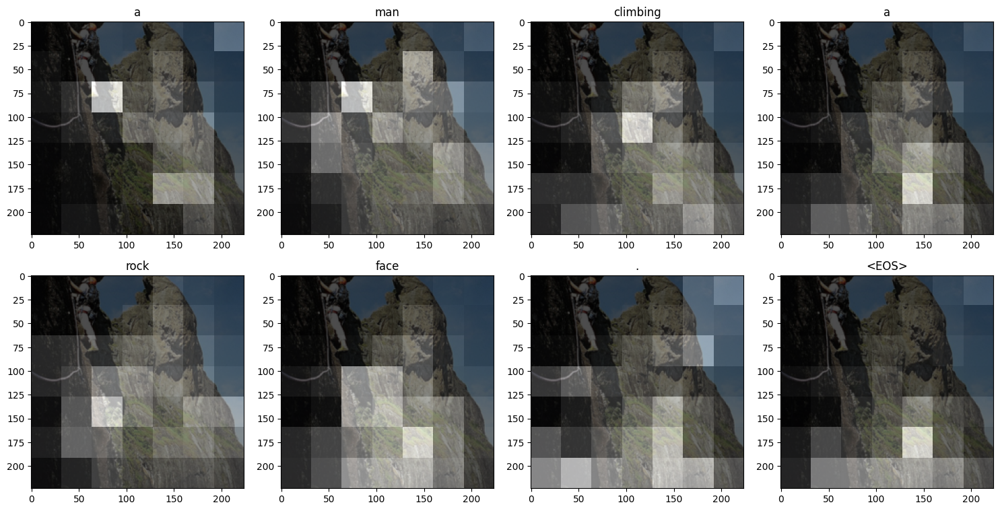

In [48]:
#show any 1
dataiter = iter(data_loader)
images,_ = next(dataiter)

img = images[0].detach().clone()
img1 = images[0].detach().clone()
caps,alphas = get_caps_from(img.unsqueeze(0))

plot_attention(img1, caps, alphas)

# Next steps

1. Evluate model with BLEU scores
2. Improve the model architecture to get better predictions
3. Make Image-to-Audio block to pronounce generated text from image